In [1]:
import tensorflow as tf
import numpy as np
import datetime
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.io import wavfile
import wave


from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("MNIST_data/")

Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


## 匯入資料
透過wavfile來讀取檔案，印出來看看他的型態(dtype)跟長度<br>
紀錄型態是為了要設定輸出的數值格式<br>
而一般的音訊檔案普遍是44.1kHz頻率，我們輸入只有一秒的音訊，因此我們將全部資料當作樣本點(原本的資料點就少了)，所以讀出來的長度應該會接近44100

接著，因為讀檔會有左右聲道(44928, 2)，我們統一取第一個值(file\[i\]\[0\])，並且切成我們要的44000長度(因為跑CNN會用到4的倍數)。<br>
完成第一步的讀檔XD

In [2]:
rate,file = wavfile.read('./input_data/05042849703.wav')
print('file', file.dtype, file.shape)

data = []
for i in range(len(file)):
    data.append(file[i][0])
data = data[:44000]
print('data:', data[0], (len(data)) )

file int16 (44928, 2)
data: 0 44000


## 傅立葉轉換

**過程: 音訊檔 => 切成一單位440的資料100份(100 * 440) => 傅立葉 => 保留虛數部分 => 正規化(位移,縮放) => 取正整數 => 訓練資料**

傅立葉是將一連串訊號做頻譜對應，因此會有實數軸(cos)與虛數軸(sin)，我們保留虛數的部分，只針對實數來訓練<br>
接著，我們要將資料進行正規化，將他取到圖片顏色的區間(0-255)，這動作是因為我們的GAN模型是吃圖片的形式，所以我們必須做正規化並且取正整數

In [3]:
def doFFT(sound):
    list = []
    for i in range(1,101):
        one = sound[(i-1)*440:i*440]
        four = np.fft.fft(one)
        list.append(four)
    return list

In [4]:
def shift(list):
    listn = []
    listx = []
    for i in list:
        listn.append(min(i.real))
        listx.append(max(i.real))
    n = min(listn)
    x = max(listx)
    for i in range(len(list)):
        for j in range(len(list[0])):
            list[i][j] = (list[i][j]-n)*255/(x-n)
    return list,n,x

In [5]:
def ishift(list,n,x):
    for i in range(len(list)):
        for j in range(len(list[0])):
            list[i][j] =((list[i][j]*(x-n))/255)+n  
    return list

In [6]:
def doIFFT(data):
    list = np.zeros([len(data), len(data[0])])
    for i in range(len(data)):
        list[i] = (np.fft.ifft(data[i]))
    list = list.real
    return list

### 測試資料

data2 => 將音訊資料轉換傅立葉<br>
data3 => 將data2去虛數, 做正規化, 取正整數<br>
data4 => 將訓練資料做逆向data3動作, 拿data2的資料蓋掉正數部分<br>
dataF => 做逆向傅立葉轉換<br>
output: 轉回音訊檔儲存

In [7]:
# data2: do fft
data2 = doFFT(data)
print('fft:', data2[0][0], (len(data2), len(data2[0])) )

# data3: do shift, data3 is formated training data
data3 = np.asarray(data2)
data3 = data3.real
data3, data_min, data_max = shift(data3)
print(data3)

data3 = data3.astype('int16')
print('shift:', data3, data3.shape)

## do training

# data4: bind training data, do ishift
data4 = np.asarray(data2)
data4.real = data3
data4 = ishift(data4, data_min, data_max)
print('ishift:', data4[0][0], data4.shape)

# dataF: do ifft
dataF = doIFFT(data4)
dataF = dataF.astype('int16')
print('ifft:', dataF[0][0], dataF.shape)

# output: change digital to sound
temp = 0
for i in dataF:
    for j in i:
        file[temp]  = j
        temp = temp + 1
        
wavfile.write('./b.wav', rate, file)

fft: (-5+0j) (100, 440)
[[ 122.78529316  122.78554649  122.78573044 ...,  122.7856295   122.78573044
   122.78554649]
 [ 122.78509174  122.78555111  122.78562052 ...,  122.78562333
   122.78562052  122.78555111]
 [ 122.78495747  122.78576932  122.7857327  ...,  122.78562726  122.7857327
   122.78576932]
 ..., 
 [ 122.78354756  122.7846517   122.78493907 ...,  122.78437935
   122.78493907  122.7846517 ]
 [ 122.78415181  122.78548692  122.78565154 ...,  122.78565507
   122.78565154  122.78548692]
 [ 122.78435322  122.78574514  122.78554885 ...,  122.78556189
   122.78554885  122.78574514]]
shift: [[122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]
 ..., 
 [122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]] (100, 440)
ishift: (-11701.6501913+0j) (100, 440)
ifft: -11701 (100, 440)


/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.


## GAN training data

所以我們的轉換過的資料(100 * 440)可以當作訓練的資料來跑，這裡我們先把資料assign給我們的模型參數

以下我們來介紹GAN的基本模型，來源是由[tensorflow](https://www.tensorflow.org/) CNN 基本範例，然後參考 [這篇GitHub](https://github.com/jonbruner/generative-adversarial-networks) 來實作。

[[122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]
 ..., 
 [122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]
 [122 122 122 ..., 122 122 122]]


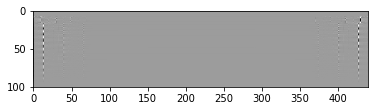

In [8]:
img_width = 440
img_height = 100

sample_image = data3
print(sample_image)

sample_image = sample_image.reshape([img_height, img_width])
plt.imshow(sample_image, cmap='Greys')

## GAN discriminator

偵探，它的目的就是要圖的找出特徵點，並且給一個數值(判斷圖片是否像的依據)。<br>
因為這是最基本的模型，所以她只有給像或不像的分數

它是透過正像CNN來分析特徵，並且整合出分數，總共有四層:<br>
第一層是把圖片用 5\*5 filter 找出32張不同的特徵，並且將長度池化一半的大小 (440 * 100 -> 220 * 50)<br>
第二層是把第一層的結果再用 5\*5 filter 找出 64張特徵，並且在池化一半的大小 (220 * 50 -> 110 * 25)<br>
第三層是全連接層，是要將全部相同的特徵整合在一起，分配到1024個點上<br>
第四層也是一個全連接層，把全部1024個點整合到1個分數<br>

In [9]:
def discriminator(images, reuse_variables=None):
    with tf.variable_scope(tf.get_variable_scope(), reuse=reuse_variables) as scope:
        # First convolutional and pool layers
        # This finds 32 different 5 x 5 pixel features
        d_w1 = tf.get_variable('d_w1', [5, 5, 1, 32], initializer=tf.truncated_normal_initializer(stddev=0.02))
        d_b1 = tf.get_variable('d_b1', [32], initializer=tf.constant_initializer(0))
        d1 = tf.nn.conv2d(input=images, filter=d_w1, strides=[1, 1, 1, 1], padding='SAME')
        d1 = d1 + d_b1
        d1 = tf.nn.relu(d1)
        d1 = tf.nn.avg_pool(d1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

        # Second convolutional and pool layers
        # This finds 64 different 5 x 5 pixel features
        d_w2 = tf.get_variable('d_w2', [5, 5, 32, 64], initializer=tf.truncated_normal_initializer(stddev=0.02))
        d_b2 = tf.get_variable('d_b2', [64], initializer=tf.constant_initializer(0))
        d2 = tf.nn.conv2d(input=d1, filter=d_w2, strides=[1, 1, 1, 1], padding='SAME')
        d2 = d2 + d_b2
        d2 = tf.nn.relu(d2)
        d2 = tf.nn.avg_pool(d2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

        # First fully connected layer
        d_w3 = tf.get_variable('d_w3', [int((img_height/4) * (img_width/4) * 64), 1024], initializer=tf.truncated_normal_initializer(stddev=0.02))
        d_b3 = tf.get_variable('d_b3', [1024], initializer=tf.constant_initializer(0))
        d3 = tf.reshape(d2, [-1, int((img_height/4) * (img_width/4) * 64)])
        d3 = tf.matmul(d3, d_w3)
        d3 = d3 + d_b3
        d3 = tf.nn.relu(d3)

        # Second fully connected layer
        d_w4 = tf.get_variable('d_w4', [1024, 1], initializer=tf.truncated_normal_initializer(stddev=0.02))
        d_b4 = tf.get_variable('d_b4', [1], initializer=tf.constant_initializer(0))
        d4 = tf.matmul(d3, d_w4) + d_b4

        # d4 contains unscaled values
        return d4

## GAN generator

工匠，反過來就是要做逆向的CNN，<br>
目的是要給一個分數，然後random出一張新的圖片。

In [10]:
def generator(z, batch_size, z_dim):
    g_w1 = tf.get_variable('g_w1', [z_dim, int((img_height/4) * (img_width/4) * 64)], dtype=tf.float32, initializer=tf.truncated_normal_initializer(stddev=0.02))
    g_b1 = tf.get_variable('g_b1', [int((img_height/4) * (img_width/4) * 64)], initializer=tf.truncated_normal_initializer(stddev=0.02))
    g1 = tf.matmul(z, g_w1) + g_b1
    g1 = tf.reshape(g1, [-1, img_height*2, img_width*2, 1])
    g1 = tf.contrib.layers.batch_norm(g1, epsilon=1e-5, scope='bn1')
    g1 = tf.nn.relu(g1)

    # Generate 50 features
    g_w2 = tf.get_variable('g_w2', [3, 3, 1, z_dim/2], dtype=tf.float32, initializer=tf.truncated_normal_initializer(stddev=0.02))
    g_b2 = tf.get_variable('g_b2', [z_dim/2], initializer=tf.truncated_normal_initializer(stddev=0.02))
    g2 = tf.nn.conv2d(g1, g_w2, strides=[1, 2, 2, 1], padding='SAME')
    g2 = g2 + g_b2
    g2 = tf.contrib.layers.batch_norm(g2, epsilon=1e-5, scope='bn2')
    g2 = tf.nn.relu(g2)
    g2 = tf.image.resize_images(g2, [img_height*2, img_width*2])

    # Generate 25 features
    g_w3 = tf.get_variable('g_w3', [3, 3, z_dim/2, z_dim/4], dtype=tf.float32, initializer=tf.truncated_normal_initializer(stddev=0.02))
    g_b3 = tf.get_variable('g_b3', [z_dim/4], initializer=tf.truncated_normal_initializer(stddev=0.02))
    g3 = tf.nn.conv2d(g2, g_w3, strides=[1, 2, 2, 1], padding='SAME')
    g3 = g3 + g_b3
    g3 = tf.contrib.layers.batch_norm(g3, epsilon=1e-5, scope='bn3')
    g3 = tf.nn.relu(g3)
    g3 = tf.image.resize_images(g3, [img_height*2, img_width*2])

    # Final convolution with one output channel
    g_w4 = tf.get_variable('g_w4', [1, 1, z_dim/4, 1], dtype=tf.float32, initializer=tf.truncated_normal_initializer(stddev=0.02))
    g_b4 = tf.get_variable('g_b4', [1], initializer=tf.truncated_normal_initializer(stddev=0.02))
    g4 = tf.nn.conv2d(g3, g_w4, strides=[1, 2, 2, 1], padding='SAME')
    g4 = g4 + g_b4
    g4 = tf.sigmoid(g4)
    
    # Dimensions of g4: batch_size x 7 x 112 x 1
    return g4

## 跑個測試INIT
看看 generated_image 能不能產生一個圖出來，看來果然沒有依據，就是一張random圖呢

In [11]:
z_dimensions = 100
z_placeholder = tf.placeholder(tf.float32, [None, z_dimensions])

In [12]:
generated_image_output = generator(z_placeholder, 1, z_dimensions)
z_batch = np.random.normal(0, 1, [1, z_dimensions])

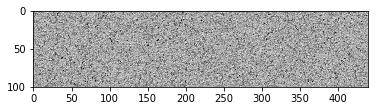

In [13]:
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    generated_image = sess.run(generated_image_output,
                                feed_dict={z_placeholder: z_batch})
    generated_image = generated_image.reshape([img_height, img_width])
    plt.imshow(generated_image, cmap='Greys')

## 訓練
Gz = 假圖、Dx = 真圖的分數、Dg = 假圖的分數

要讓偵探編成柯南，讓工匠變得厲害?<br>
我們的目標就是要
1. 讓真圖分數和真值(1)差別最小化
2. 讓假圖分數和假值(0)差別最小化

In [14]:
tf.reset_default_graph()
batch_size = 1

z_placeholder = tf.placeholder(tf.float32, [None, z_dimensions], name='z_placeholder') 
# z_placeholder is for feeding input noise to the generator

x_placeholder = tf.placeholder(tf.float32, shape = [None,img_height,img_width,1], name='x_placeholder') 
# x_placeholder is for feeding input images to the discriminator

Gz = generator(z_placeholder, batch_size, z_dimensions) 
# Gz holds the generated images

Dx = discriminator(x_placeholder) 
# Dx will hold discriminator prediction probabilities
# for the real MNIST images

Dg = discriminator(Gz, reuse_variables=True)
# Dg will hold discriminator prediction probabilities for generated images

我們知道Dx是真圖分數，Dg是假圖分數，<br>
因此分別對這兩個分數與真值(1)和假值(0)取cross_entropy(期望值)，<br>
又我們要把分數scale到一個機率分布之間，<br>
因此可以使用TensorFlow內的tf.nn.sigmoid_cross_entropy_with_logits函式

In [15]:
d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = Dx, labels = tf.ones_like(Dx)))
d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = Dg, labels = tf.zeros_like(Dg)))

In [16]:
g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = Dg, labels = tf.ones_like(Dg)))

In [17]:
tvars = tf.trainable_variables()

d_vars = [var for var in tvars if 'd_' in var.name]
g_vars = [var for var in tvars if 'g_' in var.name]

print([v.name for v in d_vars])
print([v.name for v in g_vars])

['d_w1:0', 'd_b1:0', 'd_w2:0', 'd_b2:0', 'd_w3:0', 'd_b3:0', 'd_w4:0', 'd_b4:0']
['g_w1:0', 'g_b1:0', 'g_w2:0', 'g_b2:0', 'g_w3:0', 'g_b3:0', 'g_w4:0', 'g_b4:0']


## OPT Loss Function

採用 gradient descent(GD) 來最佳化，而這裡使用 Adam optimization

In [18]:
# Train the discriminator
d_trainer_fake = tf.train.AdamOptimizer(0.0003).minimize(d_loss_fake, var_list=d_vars)
d_trainer_real = tf.train.AdamOptimizer(0.0003).minimize(d_loss_real, var_list=d_vars)

# Train the generator
g_trainer = tf.train.AdamOptimizer(0.0001).minimize(g_loss, var_list=g_vars)

## TensorBoard

後來我們沒用了，就不用動它<br>
它是tensorflow提供一個檢視的面板，可以看看目前訓練到哪一個階段

In [19]:
# From this point forward, reuse variables
tf.get_variable_scope().reuse_variables()

tf.summary.scalar('Generator_loss', g_loss)
tf.summary.scalar('Discriminator_loss_real', d_loss_real)
tf.summary.scalar('Discriminator_loss_fake', d_loss_fake)

images_for_tensorboard = generator(z_placeholder, batch_size, z_dimensions)
tf.summary.image('Generated_images', images_for_tensorboard, 5)
merged = tf.summary.merge_all()
logdir = "tensorboard/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "/"
writer = tf.summary.FileWriter(logdir, sess.graph)

## 開始訓練

這裡我們一開始要先訓練偵探，跑個300次，讓他有個方向性可以回覆工匠的東西，新手訓練拉XD<br>
之後就是跑100000次工匠-偵探的模型了，我們每100次輸出一張圖，所以目標會有1000張成果

這裡我們就可以把之前轉換好的資料拿進來跑，<br>
並且每100次輸出聲音(data4, dataF)

dLossReal: 5.05363 dLossFake: 1.17272
dLossReal: 11.2165 dLossFake: 0.0147906
dLossReal: 0.0 dLossFake: 8.5224e-06
Iteration: 0 at 2018-01-08 21:01:15.315843


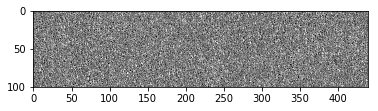

ishift: (-1821516.52114+0j) (100, 440)
ifft: 13628 (100, 440)
Estimate: [[-12.23237896]]


/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.


Iteration: 100 at 2018-01-08 21:04:02.045182


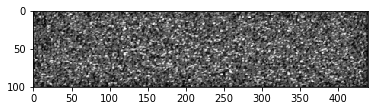

ishift: (-1820640.80778+0j) (100, 440)
ifft: 13916 (100, 440)
Estimate: [[-12.3725338]]
Iteration: 200 at 2018-01-08 21:06:48.319080


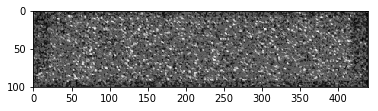

ishift: (-1819914.56259+0j) (100, 440)
ifft: 14540 (100, 440)
Estimate: [[-6.22505903]]
Iteration: 300 at 2018-01-08 21:09:34.869746


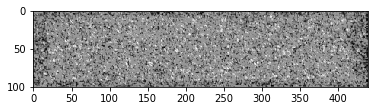

ishift: (-1820659.97604+0j) (100, 440)
ifft: 14600 (100, 440)
Estimate: [[-5.48364449]]
Iteration: 400 at 2018-01-08 21:12:21.321708


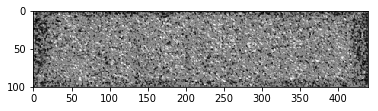

ishift: (-1819179.41909+0j) (100, 440)
ifft: 16036 (100, 440)
Estimate: [[-17.48038101]]
Iteration: 500 at 2018-01-08 21:15:07.450230


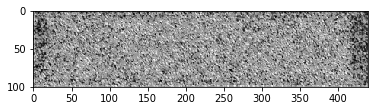

ishift: (-1822010.86917+0j) (100, 440)
ifft: 16400 (100, 440)
Estimate: [[-24.98500633]]
Iteration: 600 at 2018-01-08 21:17:53.836590


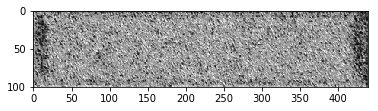

ishift: (-1821371.24512+0j) (100, 440)
ifft: 17520 (100, 440)
Estimate: [[-24.77975845]]
Iteration: 700 at 2018-01-08 21:20:40.097562


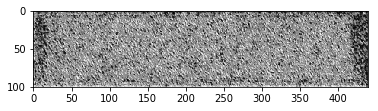

ishift: (-1815881.79673+0j) (100, 440)
ifft: 17523 (100, 440)
Estimate: [[-24.55637169]]
Iteration: 800 at 2018-01-08 21:23:26.819414


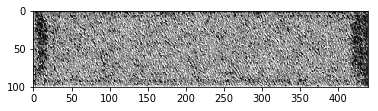

ishift: (-1821256.0749+0j) (100, 440)
ifft: 18497 (100, 440)
Estimate: [[-24.28284454]]
Iteration: 900 at 2018-01-08 21:26:13.204829


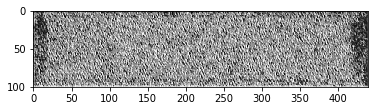

ishift: (-1821313.13311+0j) (100, 440)
ifft: 18073 (100, 440)
Estimate: [[-23.96603966]]
Iteration: 1000 at 2018-01-08 21:29:05.319597


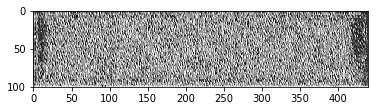

ishift: (-1821504.38729+0j) (100, 440)
ifft: 18008 (100, 440)
Estimate: [[-23.35857582]]
Iteration: 1100 at 2018-01-08 21:34:21.457416


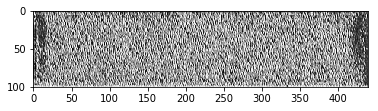

ishift: (-1821196.59659+0j) (100, 440)
ifft: 17970 (100, 440)
Estimate: [[-22.67874908]]
Iteration: 1200 at 2018-01-08 21:39:01.546134


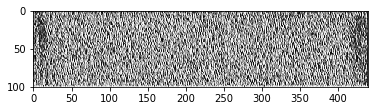

ishift: (-1820079.2448+0j) (100, 440)
ifft: 17090 (100, 440)
Estimate: [[-22.3059063]]
Iteration: 1300 at 2018-01-08 21:43:41.129085


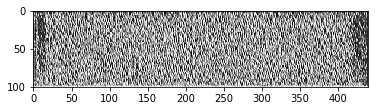

ishift: (-1819673.88208+0j) (100, 440)
ifft: 17853 (100, 440)
Estimate: [[-21.60233879]]
Iteration: 1400 at 2018-01-08 21:48:20.973517


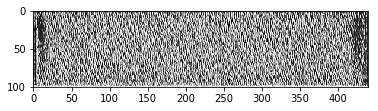

ishift: (-1821537.50715+0j) (100, 440)
ifft: 18429 (100, 440)
Estimate: [[-20.9264698]]
Iteration: 1500 at 2018-01-08 21:53:01.649560


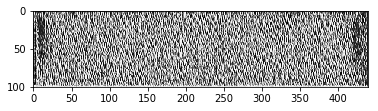

ishift: (-1820839.4932+0j) (100, 440)
ifft: 18345 (100, 440)
Estimate: [[-20.52802467]]
Iteration: 1600 at 2018-01-08 21:57:41.402153


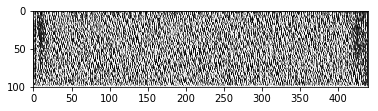

ishift: (-1818881.70967+0j) (100, 440)
ifft: 18663 (100, 440)
Estimate: [[-19.99147987]]
Iteration: 1700 at 2018-01-08 22:02:23.001388


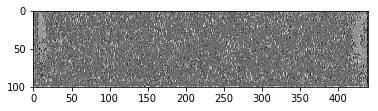

ishift: (-1820482.76801+0j) (100, 440)
ifft: 12287 (100, 440)
Estimate: [[-36.82046509]]
Iteration: 1800 at 2018-01-08 22:07:04.281353


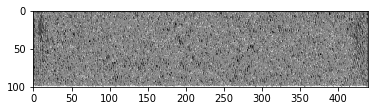

ishift: (-1819844.88002+0j) (100, 440)
ifft: 15554 (100, 440)
Estimate: [[-3.92394614]]
Iteration: 1900 at 2018-01-08 22:11:45.482279


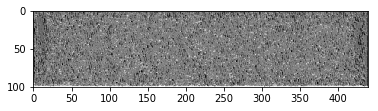

ishift: (-1822061.87443+0j) (100, 440)
ifft: 14611 (100, 440)
Estimate: [[-11.94444275]]
Iteration: 2000 at 2018-01-08 22:16:22.397067


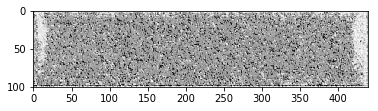

ishift: (-1819221.01112+0j) (100, 440)
ifft: 10039 (100, 440)
Estimate: [[ 2.65681291]]
Iteration: 2100 at 2018-01-08 22:20:59.199359


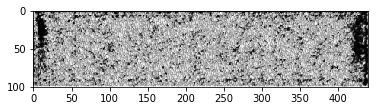

ishift: (-1819274.23407+0j) (100, 440)
ifft: 20761 (100, 440)
Estimate: [[-5.01796198]]
Iteration: 2200 at 2018-01-08 22:25:36.797146


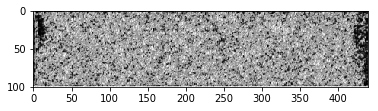

ishift: (-1817832.32702+0j) (100, 440)
ifft: 19135 (100, 440)
Estimate: [[-13.48480701]]
Iteration: 2300 at 2018-01-08 22:30:14.119266


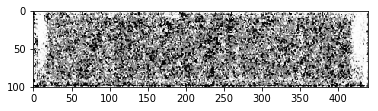

ishift: (-1821793.40302+0j) (100, 440)
ifft: 6570 (100, 440)
Estimate: [[-8.20951462]]
Iteration: 2400 at 2018-01-08 22:34:51.596558


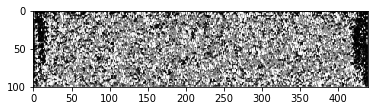

ishift: (-1816916.9357+0j) (100, 440)
ifft: 20507 (100, 440)
Estimate: [[ 14.08719158]]
Iteration: 2500 at 2018-01-08 22:39:27.893244


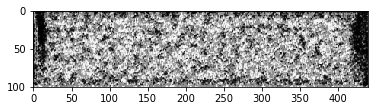

ishift: (-1816049.38378+0j) (100, 440)
ifft: 20602 (100, 440)
Estimate: [[-0.72119457]]
Iteration: 2600 at 2018-01-08 22:44:05.758051


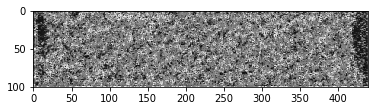

ishift: (-1819355.6825+0j) (100, 440)
ifft: 17201 (100, 440)
Estimate: [[-1.72929823]]
Iteration: 2700 at 2018-01-08 22:48:41.027072


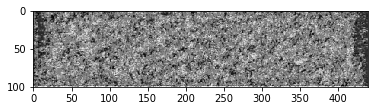

ishift: (-1817832.67237+0j) (100, 440)
ifft: 16254 (100, 440)
Estimate: [[-13.27521038]]
Iteration: 2800 at 2018-01-08 22:53:17.169116


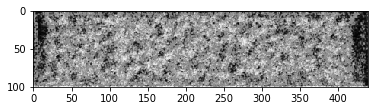

ishift: (-1820881.41194+0j) (100, 440)
ifft: 18897 (100, 440)
Estimate: [[-11.0102787]]
Iteration: 2900 at 2018-01-08 22:57:54.011718


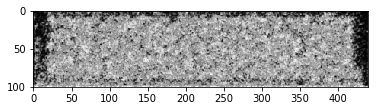

ishift: (-1817810.60459+0j) (100, 440)
ifft: 18916 (100, 440)
Estimate: [[-11.6474762]]
Iteration: 3000 at 2018-01-08 23:02:30.963230


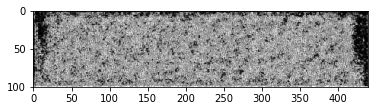

ishift: (-1823107.16838+0j) (100, 440)
ifft: 18504 (100, 440)
Estimate: [[-6.92493868]]
Iteration: 3100 at 2018-01-08 23:07:07.274652


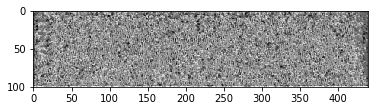

ishift: (-1820447.46242+0j) (100, 440)
ifft: 14001 (100, 440)
Estimate: [[-11.73289871]]
Iteration: 3200 at 2018-01-08 23:11:43.907354


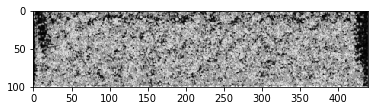

ishift: (-1820651.04488+0j) (100, 440)
ifft: 17600 (100, 440)
Estimate: [[-1.88547099]]
Iteration: 3300 at 2018-01-08 23:16:20.589525


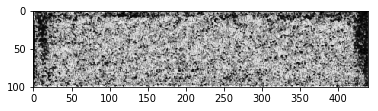

ishift: (-1814927.08168+0j) (100, 440)
ifft: 17535 (100, 440)
Estimate: [[-7.44746733]]
Iteration: 3400 at 2018-01-08 23:20:56.982961


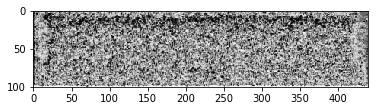

ishift: (-1819760.29059+0j) (100, 440)
ifft: 12830 (100, 440)
Estimate: [[-2.22896194]]
Iteration: 3500 at 2018-01-08 23:25:34.081838


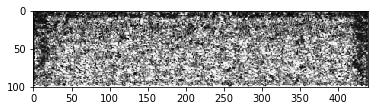

ishift: (-1818366.13505+0j) (100, 440)
ifft: 18402 (100, 440)
Estimate: [[-2.86527848]]
Iteration: 3600 at 2018-01-08 23:30:11.468364


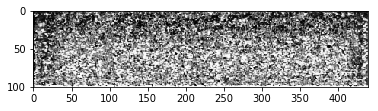

ishift: (-1814209.25184+0j) (100, 440)
ifft: 16483 (100, 440)
Estimate: [[-5.21865177]]
Iteration: 3700 at 2018-01-08 23:34:48.392089


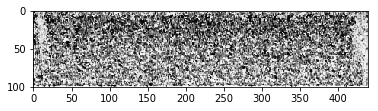

ishift: (-1817193.36836+0j) (100, 440)
ifft: 11430 (100, 440)
Estimate: [[-3.94092917]]
Iteration: 3800 at 2018-01-08 23:39:26.880549


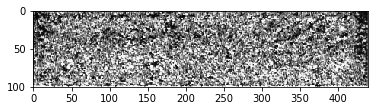

ishift: (-1814607.70755+0j) (100, 440)
ifft: 18118 (100, 440)
Estimate: [[-4.55581617]]
Iteration: 3900 at 2018-01-08 23:44:04.370610


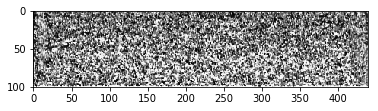

ishift: (-1816143.56844+0j) (100, 440)
ifft: 13299 (100, 440)
Estimate: [[ 2.01140785]]
Iteration: 4000 at 2018-01-08 23:48:42.358127


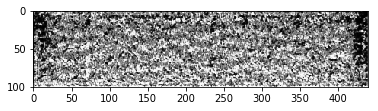

ishift: (-1814494.36086+0j) (100, 440)
ifft: 19002 (100, 440)
Estimate: [[-4.08188343]]
Iteration: 4100 at 2018-01-08 23:53:18.535404


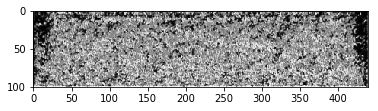

ishift: (-1817400.05986+0j) (100, 440)
ifft: 19019 (100, 440)
Estimate: [[-10.63685036]]
Iteration: 4200 at 2018-01-08 23:57:55.887444


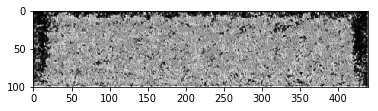

ishift: (-1814897.24309+0j) (100, 440)
ifft: 19680 (100, 440)
Estimate: [[-6.88913488]]
Iteration: 4300 at 2018-01-09 00:02:32.543589


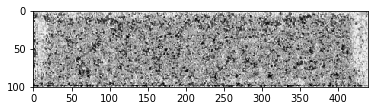

ishift: (-1819135.11841+0j) (100, 440)
ifft: 12012 (100, 440)
Estimate: [[-6.25546694]]
Iteration: 4400 at 2018-01-09 00:07:10.313182


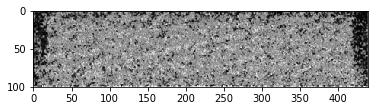

ishift: (-1814941.47718+0j) (100, 440)
ifft: 18930 (100, 440)
Estimate: [[-3.13103008]]
Iteration: 4500 at 2018-01-09 00:11:46.267039


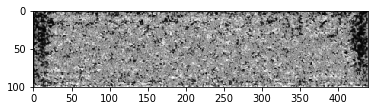

ishift: (-1815886.74615+0j) (100, 440)
ifft: 18774 (100, 440)
Estimate: [[-11.39328289]]
Iteration: 4600 at 2018-01-09 00:16:22.488560


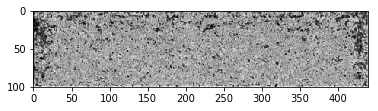

ishift: (-1814918.35471+0j) (100, 440)
ifft: 17542 (100, 440)
Estimate: [[-9.73156071]]
Iteration: 4700 at 2018-01-09 00:20:59.744648


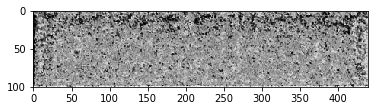

ishift: (-1815463.07545+0j) (100, 440)
ifft: 14904 (100, 440)
Estimate: [[-10.05248451]]
Iteration: 4800 at 2018-01-09 00:25:37.764730


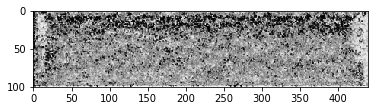

ishift: (-1816952.04953+0j) (100, 440)
ifft: 11426 (100, 440)
Estimate: [[-9.12117195]]
Iteration: 4900 at 2018-01-09 00:30:14.668737


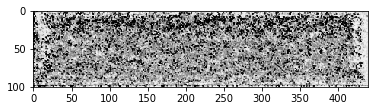

ishift: (-1819401.18791+0j) (100, 440)
ifft: 10181 (100, 440)
Estimate: [[-10.12946892]]
Iteration: 5000 at 2018-01-09 00:34:50.899227


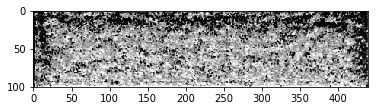

ishift: (-1814668.07366+0j) (100, 440)
ifft: 16501 (100, 440)
Estimate: [[-11.51651096]]
Iteration: 5100 at 2018-01-09 00:39:27.897893


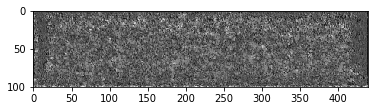

ishift: (-1819259.18249+0j) (100, 440)
ifft: 15816 (100, 440)
Estimate: [[-11.92490196]]
Iteration: 5200 at 2018-01-09 00:44:06.631293


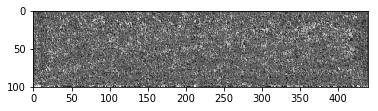

ishift: (-1818917.41478+0j) (100, 440)
ifft: 16076 (100, 440)
Estimate: [[-11.40716648]]
Iteration: 5300 at 2018-01-09 00:48:44.212840


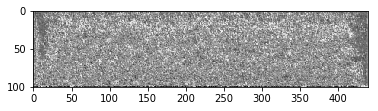

ishift: (-1818697.13389+0j) (100, 440)
ifft: 16814 (100, 440)
Estimate: [[-11.54446125]]
Iteration: 5400 at 2018-01-09 00:53:22.259392


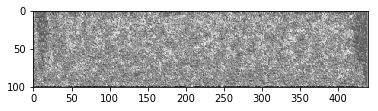

ishift: (-1817908.27116+0j) (100, 440)
ifft: 17501 (100, 440)
Estimate: [[-12.06921768]]
Iteration: 5500 at 2018-01-09 00:58:00.666876


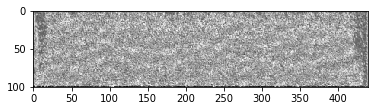

ishift: (-1818389.89051+0j) (100, 440)
ifft: 17929 (100, 440)
Estimate: [[-11.86810303]]
Iteration: 5600 at 2018-01-09 01:02:38.248069


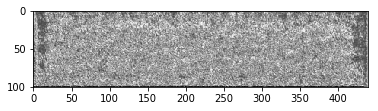

ishift: (-1817427.34605+0j) (100, 440)
ifft: 18393 (100, 440)
Estimate: [[-12.22930717]]
Iteration: 5700 at 2018-01-09 01:07:15.885156


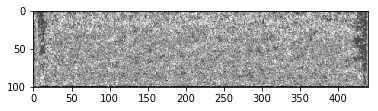

ishift: (-1817967.65892+0j) (100, 440)
ifft: 18889 (100, 440)
Estimate: [[-12.55277729]]
Iteration: 5800 at 2018-01-09 01:11:54.252817


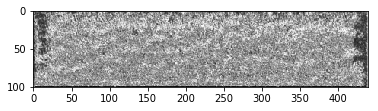

ishift: (-1817871.46431+0j) (100, 440)
ifft: 18788 (100, 440)
Estimate: [[-12.52884483]]
Iteration: 5900 at 2018-01-09 01:16:32.404505


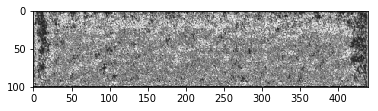

ishift: (-1816867.40062+0j) (100, 440)
ifft: 19302 (100, 440)
Estimate: [[-12.88409328]]
Iteration: 6000 at 2018-01-09 01:21:10.070979


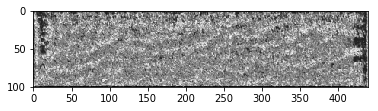

ishift: (-1817920.52975+0j) (100, 440)
ifft: 19676 (100, 440)
Estimate: [[-12.67837143]]
Iteration: 6100 at 2018-01-09 01:25:47.875028


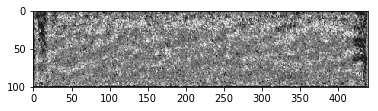

ishift: (-1815973.57459+0j) (100, 440)
ifft: 19780 (100, 440)
Estimate: [[-13.28386593]]
Iteration: 6200 at 2018-01-09 01:30:26.670900


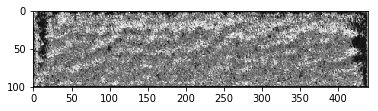

ishift: (-1819620.85267+0j) (100, 440)
ifft: 20186 (100, 440)
Estimate: [[-13.00866127]]
Iteration: 6300 at 2018-01-09 01:35:05.883175


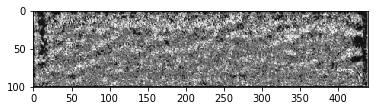

ishift: (-1818793.71025+0j) (100, 440)
ifft: 20124 (100, 440)
Estimate: [[-13.40167046]]
Iteration: 6400 at 2018-01-09 01:39:43.869551


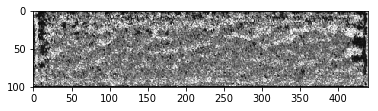

ishift: (-1818216.04188+0j) (100, 440)
ifft: 20158 (100, 440)
Estimate: [[-13.1821928]]
Iteration: 6500 at 2018-01-09 01:44:22.306770


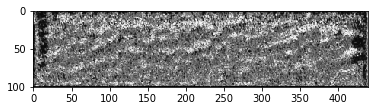

ishift: (-1820188.82283+0j) (100, 440)
ifft: 20128 (100, 440)
Estimate: [[-13.71991253]]
Iteration: 6600 at 2018-01-09 01:49:01.471843


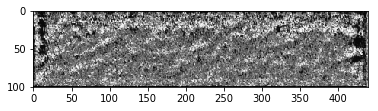

ishift: (-1819418.14024+0j) (100, 440)
ifft: 20340 (100, 440)
Estimate: [[-13.62349701]]
Iteration: 6700 at 2018-01-09 01:53:40.228213


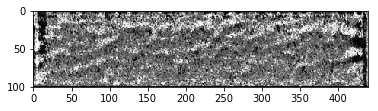

ishift: (-1817271.5515+0j) (100, 440)
ifft: 20420 (100, 440)
Estimate: [[-13.46640778]]
Iteration: 6800 at 2018-01-09 01:58:17.655424


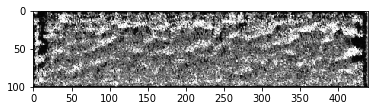

ishift: (-1820446.16358+0j) (100, 440)
ifft: 20395 (100, 440)
Estimate: [[-13.56442547]]
Iteration: 6900 at 2018-01-09 02:02:55.494245


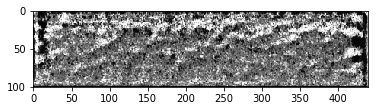

ishift: (-1820223.18293+0j) (100, 440)
ifft: 20192 (100, 440)
Estimate: [[-13.6632328]]
Iteration: 7000 at 2018-01-09 02:07:33.876044


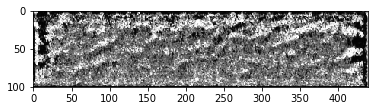

ishift: (-1820299.09244+0j) (100, 440)
ifft: 20378 (100, 440)
Estimate: [[-13.82835674]]
Iteration: 7100 at 2018-01-09 02:12:11.716050


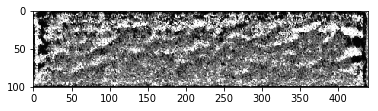

ishift: (-1820012.75739+0j) (100, 440)
ifft: 20263 (100, 440)
Estimate: [[-13.83922958]]
Iteration: 7200 at 2018-01-09 02:16:49.736733


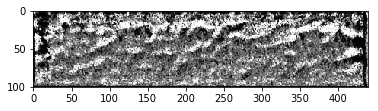

ishift: (-1820083.0978+0j) (100, 440)
ifft: 20442 (100, 440)
Estimate: [[-14.03225708]]
Iteration: 7300 at 2018-01-09 02:21:26.468434


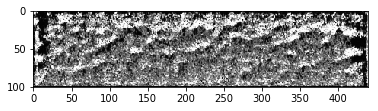

ishift: (-1820406.07635+0j) (100, 440)
ifft: 20467 (100, 440)
Estimate: [[-14.2914896]]
Iteration: 7400 at 2018-01-09 02:26:03.966319


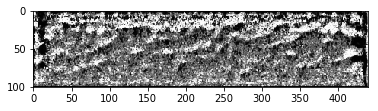

ishift: (-1820502.89774+0j) (100, 440)
ifft: 20566 (100, 440)
Estimate: [[-14.32578754]]
Iteration: 7500 at 2018-01-09 02:30:42.551442


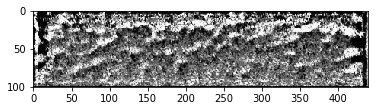

ishift: (-1820570.85888+0j) (100, 440)
ifft: 20558 (100, 440)
Estimate: [[-14.29281521]]
Iteration: 7600 at 2018-01-09 02:35:20.435878


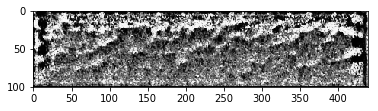

ishift: (-1821110.62487+0j) (100, 440)
ifft: 20495 (100, 440)
Estimate: [[-14.38131905]]
Iteration: 7700 at 2018-01-09 02:39:57.243441


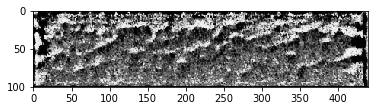

ishift: (-1821076.93061+0j) (100, 440)
ifft: 20403 (100, 440)
Estimate: [[-14.28751373]]
Iteration: 7800 at 2018-01-09 02:44:34.363071


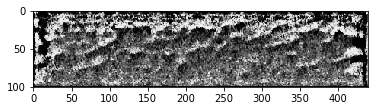

ishift: (-1821805.88534+0j) (100, 440)
ifft: 20481 (100, 440)
Estimate: [[-14.48230076]]
Iteration: 7900 at 2018-01-09 02:49:13.256915


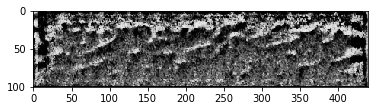

ishift: (-1820808.51824+0j) (100, 440)
ifft: 20338 (100, 440)
Estimate: [[-14.39354134]]
Iteration: 8000 at 2018-01-09 02:53:50.941547


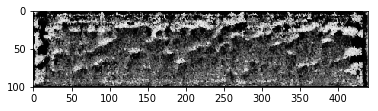

ishift: (-1822372.14384+0j) (100, 440)
ifft: 20185 (100, 440)
Estimate: [[-14.26507187]]
Iteration: 8100 at 2018-01-09 02:58:29.892176


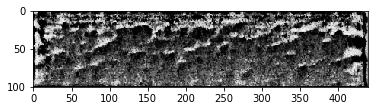

ishift: (-1823041.31085+0j) (100, 440)
ifft: 20170 (100, 440)
Estimate: [[-14.00760651]]
Iteration: 8200 at 2018-01-09 03:03:08.459083


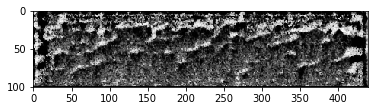

ishift: (-1824603.01705+0j) (100, 440)
ifft: 19991 (100, 440)
Estimate: [[-14.3128376]]
Iteration: 8300 at 2018-01-09 03:07:45.964318


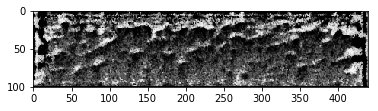

ishift: (-1825281.13897+0j) (100, 440)
ifft: 20156 (100, 440)
Estimate: [[-14.19257832]]
Iteration: 8400 at 2018-01-09 03:12:24.855573


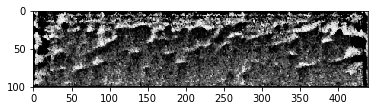

ishift: (-1825826.28163+0j) (100, 440)
ifft: 20166 (100, 440)
Estimate: [[-14.49558353]]
Iteration: 8500 at 2018-01-09 03:17:03.274001


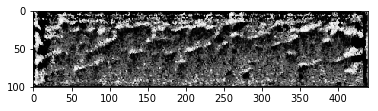

ishift: (-1824293.72865+0j) (100, 440)
ifft: 20164 (100, 440)
Estimate: [[-14.98460102]]
Iteration: 8600 at 2018-01-09 03:21:42.283491


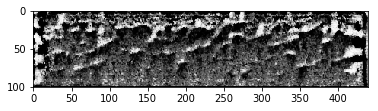

ishift: (-1824529.91517+0j) (100, 440)
ifft: 19437 (100, 440)
Estimate: [[-14.3308506]]
Iteration: 8700 at 2018-01-09 03:26:20.812126


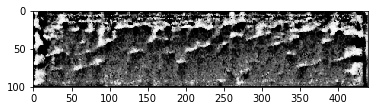

ishift: (-1826560.11787+0j) (100, 440)
ifft: 19659 (100, 440)
Estimate: [[-14.35098743]]
Iteration: 8800 at 2018-01-09 03:30:59.248506


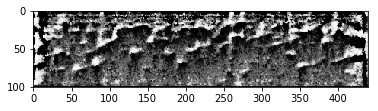

ishift: (-1826639.74966+0j) (100, 440)
ifft: 19124 (100, 440)
Estimate: [[-13.80175495]]
Iteration: 8900 at 2018-01-09 03:35:37.562316


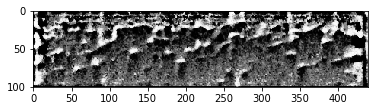

ishift: (-1826831.48369+0j) (100, 440)
ifft: 19362 (100, 440)
Estimate: [[-14.08183289]]
Iteration: 9000 at 2018-01-09 03:40:16.042346


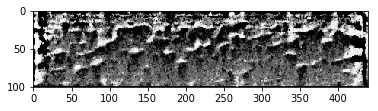

ishift: (-1827043.71355+0j) (100, 440)
ifft: 19067 (100, 440)
Estimate: [[-14.36766052]]
Iteration: 9100 at 2018-01-09 03:44:55.356036


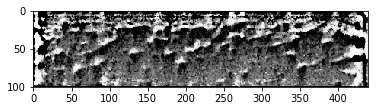

ishift: (-1828204.87252+0j) (100, 440)
ifft: 19131 (100, 440)
Estimate: [[-14.12089825]]
Iteration: 9200 at 2018-01-09 03:49:32.616717


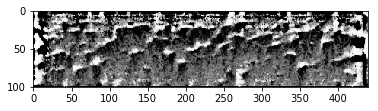

ishift: (-1828052.04174+0j) (100, 440)
ifft: 18689 (100, 440)
Estimate: [[-13.80280209]]
Iteration: 9300 at 2018-01-09 03:54:11.873320


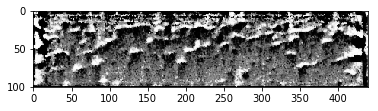

ishift: (-1828283.15548+0j) (100, 440)
ifft: 19003 (100, 440)
Estimate: [[-14.95513916]]
Iteration: 9400 at 2018-01-09 03:58:51.215178


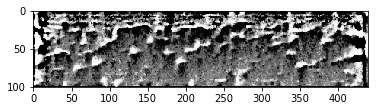

ishift: (-1827814.5505+0j) (100, 440)
ifft: 19020 (100, 440)
Estimate: [[-14.69105721]]
Iteration: 9500 at 2018-01-09 04:03:30.875094


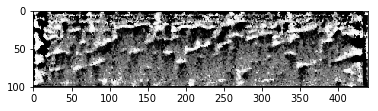

ishift: (-1827904.20566+0j) (100, 440)
ifft: 18977 (100, 440)
Estimate: [[-15.10882759]]
Iteration: 9600 at 2018-01-09 04:08:11.298329


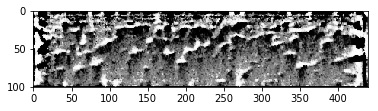

ishift: (-1827963.05753+0j) (100, 440)
ifft: 18168 (100, 440)
Estimate: [[-14.12615967]]
Iteration: 9700 at 2018-01-09 04:12:50.529567


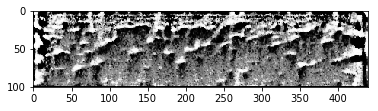

ishift: (-1828321.49093+0j) (100, 440)
ifft: 18494 (100, 440)
Estimate: [[-15.31766033]]
Iteration: 9800 at 2018-01-09 04:17:34.412014


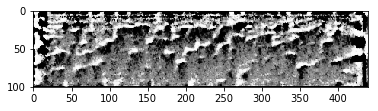

ishift: (-1828217.26916+0j) (100, 440)
ifft: 18299 (100, 440)
Estimate: [[-14.42438698]]
Iteration: 9900 at 2018-01-09 04:22:13.832016


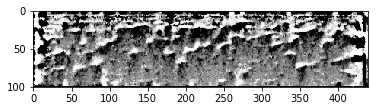

ishift: (-1828574.33651+0j) (100, 440)
ifft: 18557 (100, 440)
Estimate: [[-15.53623104]]
Iteration: 10000 at 2018-01-09 04:26:52.832834


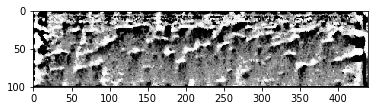

ishift: (-1828538.45019+0j) (100, 440)
ifft: 18487 (100, 440)
Estimate: [[-14.50010586]]
Iteration: 10100 at 2018-01-09 04:31:32.252694


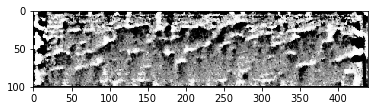

ishift: (-1827780.33156+0j) (100, 440)
ifft: 18084 (100, 440)
Estimate: [[-14.39534569]]
Iteration: 10200 at 2018-01-09 04:36:11.710479


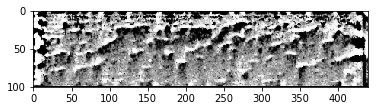

ishift: (-1827423.88436+0j) (100, 440)
ifft: 18008 (100, 440)
Estimate: [[-14.541605]]
Iteration: 10300 at 2018-01-09 04:40:51.674870


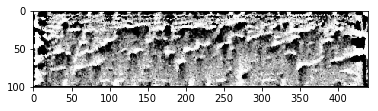

ishift: (-1828490.77858+0j) (100, 440)
ifft: 18076 (100, 440)
Estimate: [[-14.95885563]]
Iteration: 10400 at 2018-01-09 04:45:30.707113


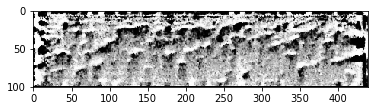

ishift: (-1828061.04087+0j) (100, 440)
ifft: 17820 (100, 440)
Estimate: [[-14.93809509]]
Iteration: 10500 at 2018-01-09 04:50:10.337242


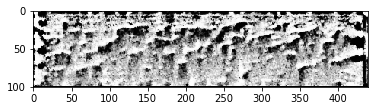

ishift: (-1828126.8095+0j) (100, 440)
ifft: 17942 (100, 440)
Estimate: [[-14.81685925]]
Iteration: 10600 at 2018-01-09 04:54:47.779103


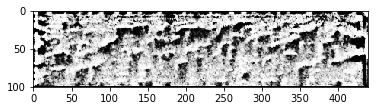

ishift: (-1827880.608+0j) (100, 440)
ifft: 17509 (100, 440)
Estimate: [[-13.47301102]]
Iteration: 10700 at 2018-01-09 04:59:26.931559


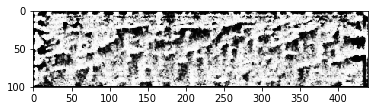

ishift: (-1827860.13792+0j) (100, 440)
ifft: 16834 (100, 440)
Estimate: [[-13.66017532]]
Iteration: 10800 at 2018-01-09 05:04:05.888249


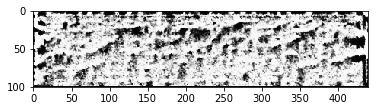

ishift: (-1828226.78587+0j) (100, 440)
ifft: 16840 (100, 440)
Estimate: [[-15.6058588]]
Iteration: 10900 at 2018-01-09 05:08:44.374190


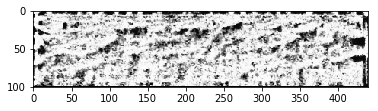

ishift: (-1824224.30665+0j) (100, 440)
ifft: 16174 (100, 440)
Estimate: [[-15.24131966]]
Iteration: 11000 at 2018-01-09 05:13:23.434028


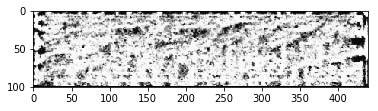

ishift: (-1827300.78475+0j) (100, 440)
ifft: 16622 (100, 440)
Estimate: [[-17.10367203]]
Iteration: 11100 at 2018-01-09 05:18:01.336861


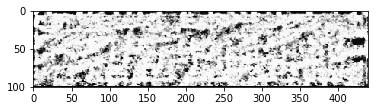

ishift: (-1828324.89899+0j) (100, 440)
ifft: 15366 (100, 440)
Estimate: [[-16.32271004]]
Iteration: 11200 at 2018-01-09 05:22:39.870007


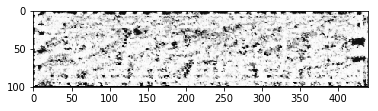

ishift: (-1827957.07577+0j) (100, 440)
ifft: 15479 (100, 440)
Estimate: [[-17.15426064]]
Iteration: 11300 at 2018-01-09 05:27:21.346408


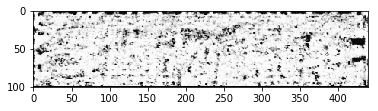

ishift: (-1828375.72885+0j) (100, 440)
ifft: 16210 (100, 440)
Estimate: [[-16.49500465]]
Iteration: 11400 at 2018-01-09 05:32:00.387857


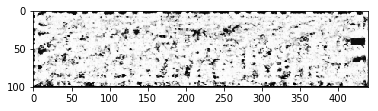

ishift: (-1826255.35164+0j) (100, 440)
ifft: 16034 (100, 440)
Estimate: [[-16.6873703]]
Iteration: 11500 at 2018-01-09 05:36:40.768422


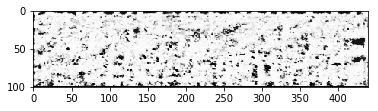

ishift: (-1827641.08273+0j) (100, 440)
ifft: 14977 (100, 440)
Estimate: [[-17.3876667]]
Iteration: 11600 at 2018-01-09 05:41:18.853233


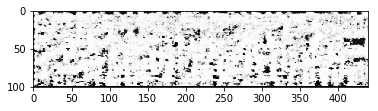

ishift: (-1826311.85564+0j) (100, 440)
ifft: 15258 (100, 440)
Estimate: [[-17.29524994]]
Iteration: 11700 at 2018-01-09 05:45:57.754745


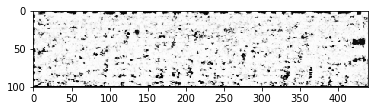

ishift: (-1824144.53969+0j) (100, 440)
ifft: 15556 (100, 440)
Estimate: [[-16.99369621]]
Iteration: 11800 at 2018-01-09 05:50:37.541812


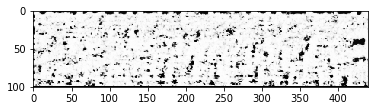

ishift: (-1827853.42579+0j) (100, 440)
ifft: 15769 (100, 440)
Estimate: [[-16.28316689]]
Iteration: 11900 at 2018-01-09 05:55:16.748466


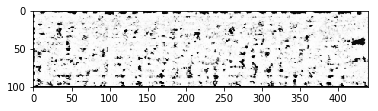

ishift: (-1824360.72299+0j) (100, 440)
ifft: 15457 (100, 440)
Estimate: [[-15.86694622]]
Iteration: 12000 at 2018-01-09 05:59:55.448225


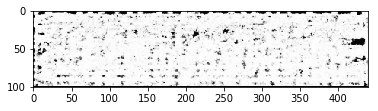

ishift: (-1827755.08373+0j) (100, 440)
ifft: 16049 (100, 440)
Estimate: [[-16.85380363]]
Iteration: 12100 at 2018-01-09 06:04:33.920669


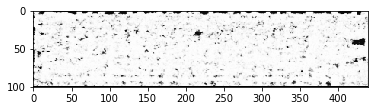

ishift: (-1827682.14076+0j) (100, 440)
ifft: 15127 (100, 440)
Estimate: [[-17.23310661]]
Iteration: 12200 at 2018-01-09 06:09:12.799163


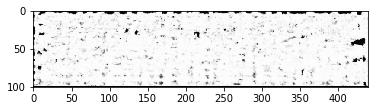

ishift: (-1826999.4384+0j) (100, 440)
ifft: 15846 (100, 440)
Estimate: [[-17.0392952]]
Iteration: 12300 at 2018-01-09 06:13:52.180522


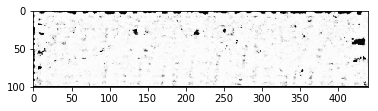

ishift: (-1823860.39925+0j) (100, 440)
ifft: 15911 (100, 440)
Estimate: [[-17.04035568]]
Iteration: 12400 at 2018-01-09 06:18:30.855207


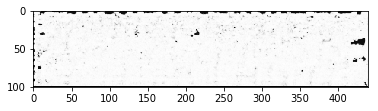

ishift: (-1828393.24388+0j) (100, 440)
ifft: 15311 (100, 440)
Estimate: [[-17.1155777]]
Iteration: 12500 at 2018-01-09 06:23:09.990865


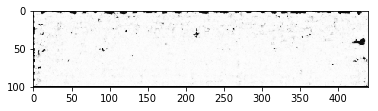

ishift: (-1828219.30558+0j) (100, 440)
ifft: 15541 (100, 440)
Estimate: [[-16.98693275]]
Iteration: 12600 at 2018-01-09 06:27:48.680371


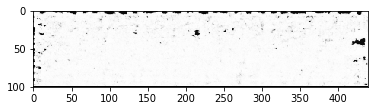

ishift: (-1827119.46038+0j) (100, 440)
ifft: 15507 (100, 440)
Estimate: [[-16.88899612]]
Iteration: 12700 at 2018-01-09 06:32:29.341659


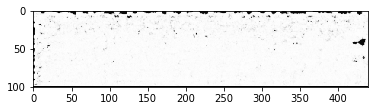

ishift: (-1827936.98466+0j) (100, 440)
ifft: 15055 (100, 440)
Estimate: [[-16.58211517]]
Iteration: 12800 at 2018-01-09 06:37:08.207047


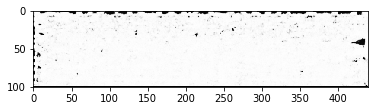

ishift: (-1828323.61841+0j) (100, 440)
ifft: 15656 (100, 440)
Estimate: [[-16.74409103]]
Iteration: 12900 at 2018-01-09 06:41:46.599651


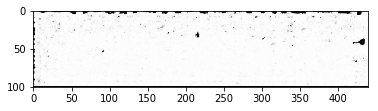

ishift: (-1827210.17733+0j) (100, 440)
ifft: 15452 (100, 440)
Estimate: [[-16.53351021]]
Iteration: 13000 at 2018-01-09 06:46:25.399860


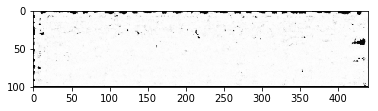

ishift: (-1827992.2978+0j) (100, 440)
ifft: 15730 (100, 440)
Estimate: [[-16.77574921]]
Iteration: 13100 at 2018-01-09 06:51:04.384671


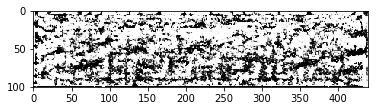

ishift: (-1827772.43645+0j) (100, 440)
ifft: 8495 (100, 440)
Estimate: [[-34.97567368]]
Iteration: 13200 at 2018-01-09 06:55:44.213851


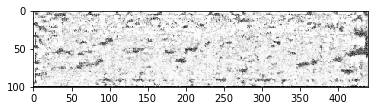

ishift: (-1825514.35228+0j) (100, 440)
ifft: 8259 (100, 440)
Estimate: [[-19.2741375]]
Iteration: 13300 at 2018-01-09 07:00:24.154882


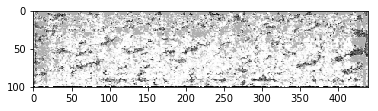

ishift: (-1825544.46032+0j) (100, 440)
ifft: 12796 (100, 440)
Estimate: [[-15.63170624]]
Iteration: 13400 at 2018-01-09 07:05:02.472466


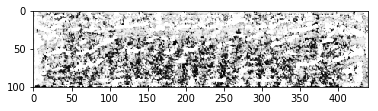

ishift: (-1828846.11503+0j) (100, 440)
ifft: 8200 (100, 440)
Estimate: [[-11.48929119]]
Iteration: 13500 at 2018-01-09 07:09:40.891024


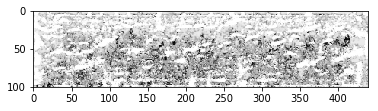

ishift: (-1828846.31996+0j) (100, 440)
ifft: 8052 (100, 440)
Estimate: [[-41.74835587]]
Iteration: 13600 at 2018-01-09 07:14:18.877320


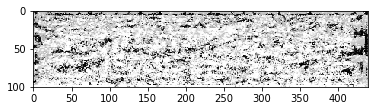

ishift: (-1817162.14748+0j) (100, 440)
ifft: 12251 (100, 440)
Estimate: [[-71.88373566]]
Iteration: 13700 at 2018-01-09 07:18:57.357347


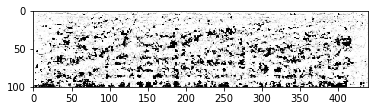

ishift: (-1827562.26127+0j) (100, 440)
ifft: 6481 (100, 440)
Estimate: [[-61.26050949]]
Iteration: 13800 at 2018-01-09 07:23:36.452499


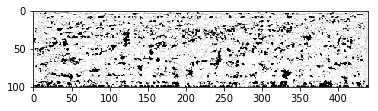

ishift: (-1828679.48866+0j) (100, 440)
ifft: 6988 (100, 440)
Estimate: [[-58.22906876]]
Iteration: 13900 at 2018-01-09 07:28:14.447228


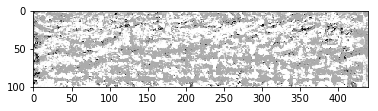

ishift: (-1819665.60345+0j) (100, 440)
ifft: 11701 (100, 440)
Estimate: [[-6.77926254]]
Iteration: 14000 at 2018-01-09 07:32:52.831219


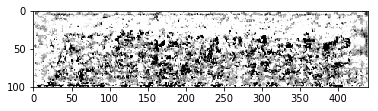

ishift: (-1828759.05668+0j) (100, 440)
ifft: 7613 (100, 440)
Estimate: [[-102.78154755]]
Iteration: 14100 at 2018-01-09 07:37:31.344529


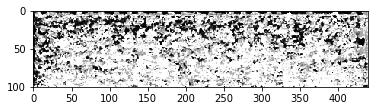

ishift: (-1816572.18234+0j) (100, 440)
ifft: 18774 (100, 440)
Estimate: [[-59.92566299]]
Iteration: 14200 at 2018-01-09 07:42:09.282679


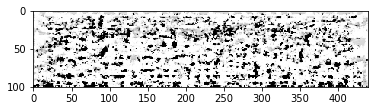

ishift: (-1828327.0309+0j) (100, 440)
ifft: 8721 (100, 440)
Estimate: [[-112.95806122]]
Iteration: 14300 at 2018-01-09 07:46:47.463937


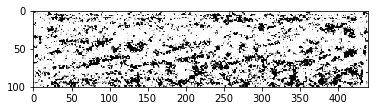

ishift: (-1816148.26484+0j) (100, 440)
ifft: 6864 (100, 440)
Estimate: [[-10.38286495]]
Iteration: 14400 at 2018-01-09 07:51:24.921756


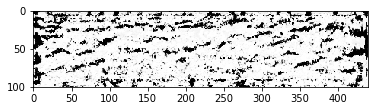

ishift: (-1813954.12967+0j) (100, 440)
ifft: 11031 (100, 440)
Estimate: [[-194.4931488]]
Iteration: 14500 at 2018-01-09 07:56:03.522577


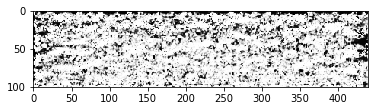

ishift: (-1828846.37921+0j) (100, 440)
ifft: 19459 (100, 440)
Estimate: [[-196.05749512]]
Iteration: 14600 at 2018-01-09 08:00:41.413511


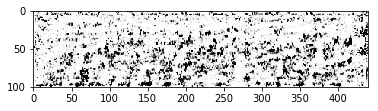

ishift: (-1828105.00013+0j) (100, 440)
ifft: 7576 (100, 440)
Estimate: [[-59.35807419]]
Iteration: 14700 at 2018-01-09 08:05:18.765454


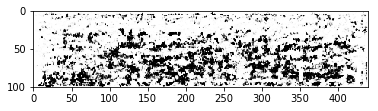

ishift: (-1828842.82395+0j) (100, 440)
ifft: 6268 (100, 440)
Estimate: [[-178.15922546]]
Iteration: 14800 at 2018-01-09 08:09:57.601161


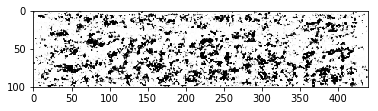

ishift: (-1828128.5873+0j) (100, 440)
ifft: 6550 (100, 440)
Estimate: [[-151.19468689]]
Iteration: 14900 at 2018-01-09 08:14:35.975914


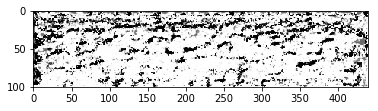

ishift: (-1814126.25066+0j) (100, 440)
ifft: 15100 (100, 440)
Estimate: [[-210.30693054]]
Iteration: 15000 at 2018-01-09 08:19:13.979360


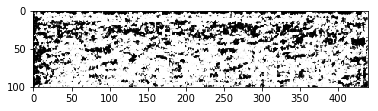

ishift: (-1814405.51714+0j) (100, 440)
ifft: 20063 (100, 440)
Estimate: [[-208.79507446]]
Iteration: 15100 at 2018-01-09 08:23:53.385462


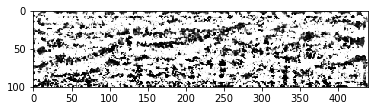

ishift: (-1828836.8571+0j) (100, 440)
ifft: 14555 (100, 440)
Estimate: [[-46.314785]]
Iteration: 15200 at 2018-01-09 08:28:30.004416


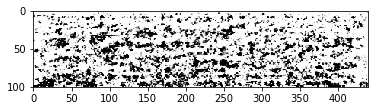

ishift: (-1828846.21173+0j) (100, 440)
ifft: 6404 (100, 440)
Estimate: [[-113.36359406]]
Iteration: 15300 at 2018-01-09 08:33:09.395579


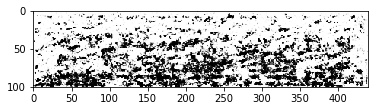

ishift: (-1828844.19204+0j) (100, 440)
ifft: 6250 (100, 440)
Estimate: [[-56.8132782]]
Iteration: 15400 at 2018-01-09 08:37:48.268077


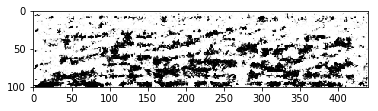

ishift: (-1828842.34518+0j) (100, 440)
ifft: 6308 (100, 440)
Estimate: [[-158.68193054]]
Iteration: 15500 at 2018-01-09 08:42:25.401801


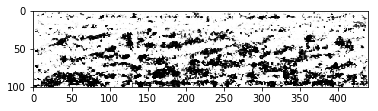

ishift: (-1828844.90931+0j) (100, 440)
ifft: 6292 (100, 440)
Estimate: [[-91.99394989]]
Iteration: 15600 at 2018-01-09 08:47:04.120889


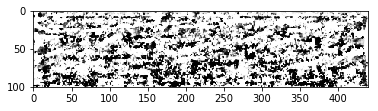

ishift: (-1828846.04073+0j) (100, 440)
ifft: 9260 (100, 440)
Estimate: [[-52.64044189]]
Iteration: 15700 at 2018-01-09 08:51:41.645787


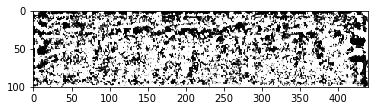

ishift: (-1828806.27612+0j) (100, 440)
ifft: 18009 (100, 440)
Estimate: [[-157.75361633]]
Iteration: 15800 at 2018-01-09 08:56:18.546106


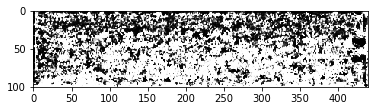

ishift: (-1815418.52176+0j) (100, 440)
ifft: 18494 (100, 440)
Estimate: [[-141.26795959]]
Iteration: 15900 at 2018-01-09 09:00:57.258517


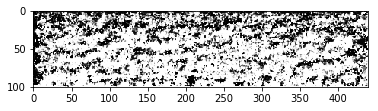

ishift: (-1818577.53361+0j) (100, 440)
ifft: 19643 (100, 440)
Estimate: [[-80.9278183]]
Iteration: 16000 at 2018-01-09 09:05:33.963236


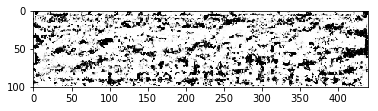

ishift: (-1813971.21695+0j) (100, 440)
ifft: 9170 (100, 440)
Estimate: [[-55.53764725]]
Iteration: 16100 at 2018-01-09 09:10:12.414274


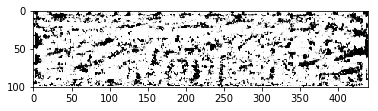

ishift: (-1814000.2583+0j) (100, 440)
ifft: 8879 (100, 440)
Estimate: [[-20.63691711]]
Iteration: 16200 at 2018-01-09 09:14:50.726796


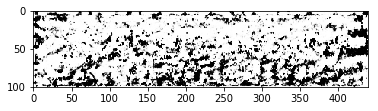

ishift: (-1816165.14881+0j) (100, 440)
ifft: 8557 (100, 440)
Estimate: [[-37.29712677]]
Iteration: 16300 at 2018-01-09 09:19:27.955181


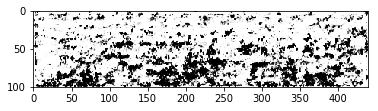

ishift: (-1828277.14964+0j) (100, 440)
ifft: 7369 (100, 440)
Estimate: [[-44.16090393]]
Iteration: 16400 at 2018-01-09 09:24:06.528218


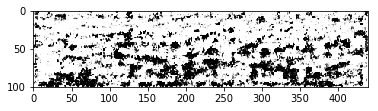

ishift: (-1828564.51698+0j) (100, 440)
ifft: 7638 (100, 440)
Estimate: [[-90.06098938]]
Iteration: 16500 at 2018-01-09 09:28:45.322551


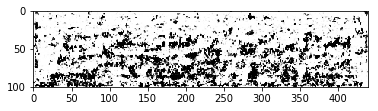

ishift: (-1828504.63799+0j) (100, 440)
ifft: 7286 (100, 440)
Estimate: [[-115.00354767]]
Iteration: 16600 at 2018-01-09 09:33:22.295059


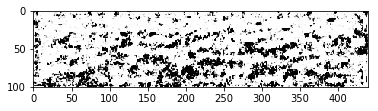

ishift: (-1814417.93909+0j) (100, 440)
ifft: 8483 (100, 440)
Estimate: [[-89.21269226]]
Iteration: 16700 at 2018-01-09 09:38:01.749400


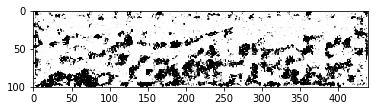

ishift: (-1820781.72477+0j) (100, 440)
ifft: 8449 (100, 440)
Estimate: [[-61.32853317]]
Iteration: 16800 at 2018-01-09 09:42:39.189596


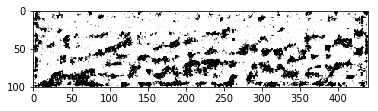

ishift: (-1816357.26814+0j) (100, 440)
ifft: 8610 (100, 440)
Estimate: [[-50.67519379]]
Iteration: 16900 at 2018-01-09 09:47:17.333439


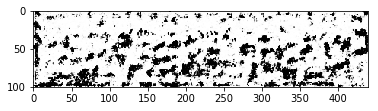

ishift: (-1820997.13258+0j) (100, 440)
ifft: 7719 (100, 440)
Estimate: [[-55.94057846]]
Iteration: 17000 at 2018-01-09 09:51:57.109389


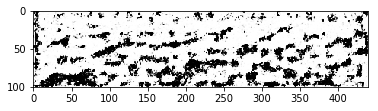

ishift: (-1817903.49308+0j) (100, 440)
ifft: 8094 (100, 440)
Estimate: [[-47.78802109]]
Iteration: 17100 at 2018-01-09 09:56:34.533040


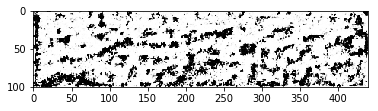

ishift: (-1814404.27335+0j) (100, 440)
ifft: 9046 (100, 440)
Estimate: [[-55.06973648]]
Iteration: 17200 at 2018-01-09 10:01:12.818537


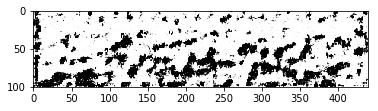

ishift: (-1827344.2256+0j) (100, 440)
ifft: 9014 (100, 440)
Estimate: [[-30.77801323]]
Iteration: 17300 at 2018-01-09 10:05:50.013867


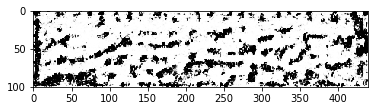

ishift: (-1813956.61193+0j) (100, 440)
ifft: 9866 (100, 440)
Estimate: [[-25.09861946]]
Iteration: 17400 at 2018-01-09 10:10:26.521307


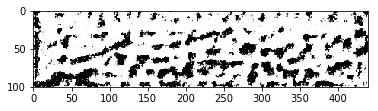

ishift: (-1813963.03419+0j) (100, 440)
ifft: 9593 (100, 440)
Estimate: [[-15.0604763]]
Iteration: 17500 at 2018-01-09 10:15:03.676733


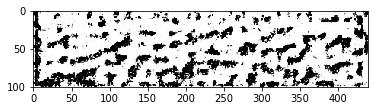

ishift: (-1814125.82719+0j) (100, 440)
ifft: 9217 (100, 440)
Estimate: [[-18.00247955]]
Iteration: 17600 at 2018-01-09 10:19:40.552347


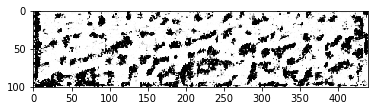

ishift: (-1814161.99927+0j) (100, 440)
ifft: 9313 (100, 440)
Estimate: [[-28.80837631]]
Iteration: 17700 at 2018-01-09 10:24:16.427123


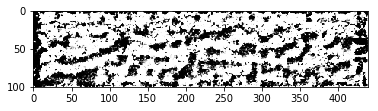

ishift: (-1813984.55953+0j) (100, 440)
ifft: 19222 (100, 440)
Estimate: [[-51.32107162]]
Iteration: 17800 at 2018-01-09 10:28:55.914771


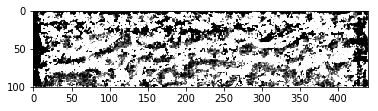

ishift: (-1813981.37059+0j) (100, 440)
ifft: 20410 (100, 440)
Estimate: [[-31.03477287]]
Iteration: 17900 at 2018-01-09 10:33:33.624536


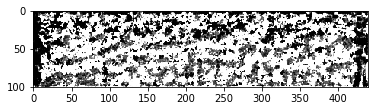

ishift: (-1813952.157+0j) (100, 440)
ifft: 20287 (100, 440)
Estimate: [[-42.26711273]]
Iteration: 18000 at 2018-01-09 10:38:11.372201


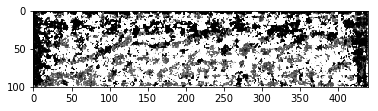

ishift: (-1813956.07482+0j) (100, 440)
ifft: 20719 (100, 440)
Estimate: [[-29.33363152]]
Iteration: 18100 at 2018-01-09 10:42:49.990052


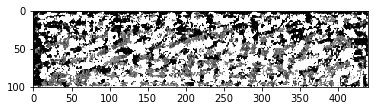

ishift: (-1813959.39959+0j) (100, 440)
ifft: 20729 (100, 440)
Estimate: [[ 10.08507347]]
Iteration: 18200 at 2018-01-09 10:47:27.615226


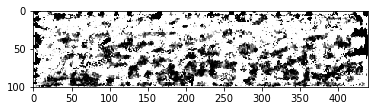

ishift: (-1813981.88462+0j) (100, 440)
ifft: 9848 (100, 440)
Estimate: [[-95.66661835]]
Iteration: 18300 at 2018-01-09 10:52:05.511397


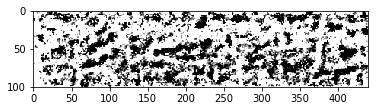

ishift: (-1827474.7529+0j) (100, 440)
ifft: 6961 (100, 440)
Estimate: [[-115.47373962]]
Iteration: 18400 at 2018-01-09 10:56:44.326987


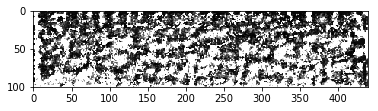

ishift: (-1828648.36261+0j) (100, 440)
ifft: 17394 (100, 440)
Estimate: [[-7.79026842]]
Iteration: 18500 at 2018-01-09 11:01:20.657313


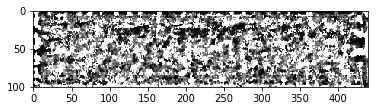

ishift: (-1828846.36165+0j) (100, 440)
ifft: 17592 (100, 440)
Estimate: [[-92.23085022]]
Iteration: 18600 at 2018-01-09 11:06:00.639854


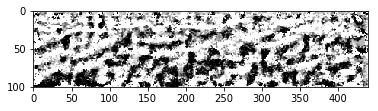

ishift: (-1828809.68492+0j) (100, 440)
ifft: 10790 (100, 440)
Estimate: [[-50.65083313]]
Iteration: 18700 at 2018-01-09 11:10:39.683567


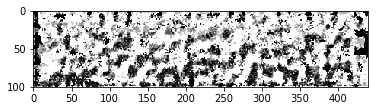

ishift: (-1813952.50502+0j) (100, 440)
ifft: 12681 (100, 440)
Estimate: [[-177.10598755]]
Iteration: 18800 at 2018-01-09 11:15:17.323579


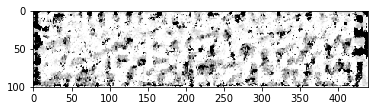

ishift: (-1813951.83917+0j) (100, 440)
ifft: 11816 (100, 440)
Estimate: [[-203.7842865]]
Iteration: 18900 at 2018-01-09 11:19:55.756296


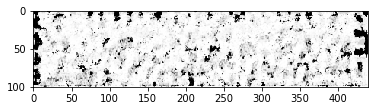

ishift: (-1814003.83165+0j) (100, 440)
ifft: 12114 (100, 440)
Estimate: [[-190.67637634]]
Iteration: 19000 at 2018-01-09 11:24:33.030999


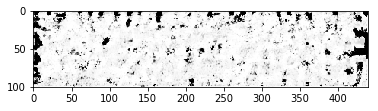

ishift: (-1813955.41785+0j) (100, 440)
ifft: 12320 (100, 440)
Estimate: [[-179.45779419]]
Iteration: 19100 at 2018-01-09 11:29:10.902988


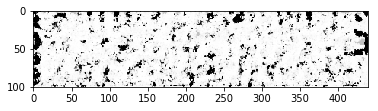

ishift: (-1813951.79479+0j) (100, 440)
ifft: 12208 (100, 440)
Estimate: [[-186.74365234]]
Iteration: 19200 at 2018-01-09 11:33:51.017122


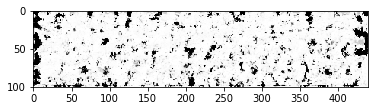

ishift: (-1813971.33413+0j) (100, 440)
ifft: 12323 (100, 440)
Estimate: [[-176.70367432]]
Iteration: 19300 at 2018-01-09 11:38:28.139553


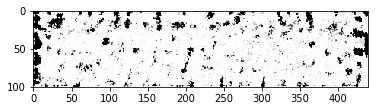

ishift: (-1813951.75395+0j) (100, 440)
ifft: 12253 (100, 440)
Estimate: [[-162.45887756]]
Iteration: 19400 at 2018-01-09 11:43:07.031150


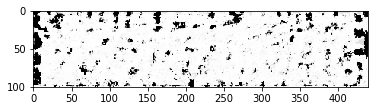

ishift: (-1813951.79834+0j) (100, 440)
ifft: 11794 (100, 440)
Estimate: [[-160.75946045]]
Iteration: 19500 at 2018-01-09 11:47:45.226991


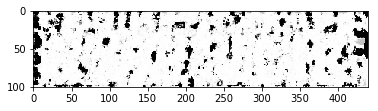

ishift: (-1813951.88356+0j) (100, 440)
ifft: 12268 (100, 440)
Estimate: [[-148.09606934]]
Iteration: 19600 at 2018-01-09 11:52:21.944857


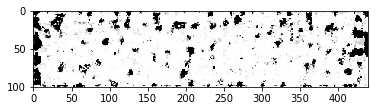

ishift: (-1813951.75395+0j) (100, 440)
ifft: 12081 (100, 440)
Estimate: [[-148.01196289]]
Iteration: 19700 at 2018-01-09 11:57:00.932844


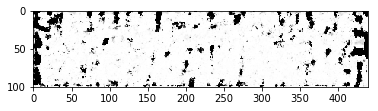

ishift: (-1813953.08918+0j) (100, 440)
ifft: 12194 (100, 440)
Estimate: [[-146.19483948]]
Iteration: 19800 at 2018-01-09 12:01:41.297912


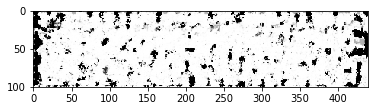

ishift: (-1813951.75395+0j) (100, 440)
ifft: 13635 (100, 440)
Estimate: [[-153.95144653]]
Iteration: 19900 at 2018-01-09 12:06:19.079294


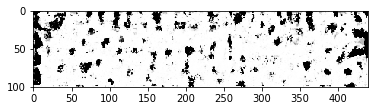

ishift: (-1813951.76993+0j) (100, 440)
ifft: 12892 (100, 440)
Estimate: [[-141.27314758]]
Iteration: 20000 at 2018-01-09 12:10:58.211125


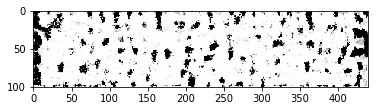

ishift: (-1813951.7646+0j) (100, 440)
ifft: 12756 (100, 440)
Estimate: [[-138.86647034]]
Iteration: 20100 at 2018-01-09 12:15:35.400536


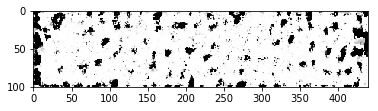

ishift: (-1813951.97767+0j) (100, 440)
ifft: 12285 (100, 440)
Estimate: [[-142.42008972]]
Iteration: 20200 at 2018-01-09 12:20:15.834442


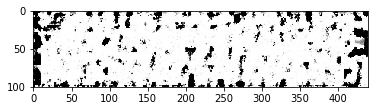

ishift: (-1813965.42057+0j) (100, 440)
ifft: 13973 (100, 440)
Estimate: [[-141.39541626]]
Iteration: 20300 at 2018-01-09 12:24:54.205537


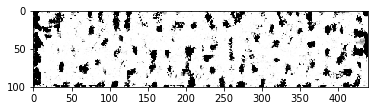

ishift: (-1813951.7575+0j) (100, 440)
ifft: 11282 (100, 440)
Estimate: [[-131.0451355]]
Iteration: 20400 at 2018-01-09 12:29:33.230089


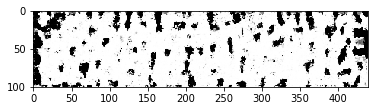

ishift: (-1814212.76038+0j) (100, 440)
ifft: 14253 (100, 440)
Estimate: [[-120.48948669]]
Iteration: 20500 at 2018-01-09 12:34:12.680444


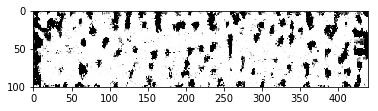

ishift: (-1813951.75572+0j) (100, 440)
ifft: 14409 (100, 440)
Estimate: [[-117.69481659]]
Iteration: 20600 at 2018-01-09 12:38:52.493286


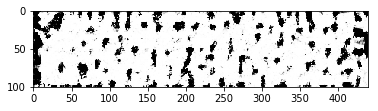

ishift: (-1813956.75397+0j) (100, 440)
ifft: 13095 (100, 440)
Estimate: [[-120.71490479]]
Iteration: 20700 at 2018-01-09 12:43:30.233524


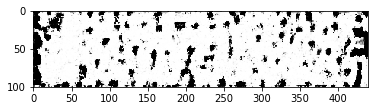

ishift: (-1813952.38605+0j) (100, 440)
ifft: 13474 (100, 440)
Estimate: [[-127.05822754]]
Iteration: 20800 at 2018-01-09 12:48:08.709841


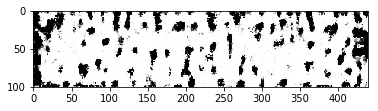

ishift: (-1813951.79656+0j) (100, 440)
ifft: 14876 (100, 440)
Estimate: [[-107.23124695]]
Iteration: 20900 at 2018-01-09 12:52:46.943633


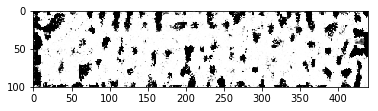

ishift: (-1813951.81609+0j) (100, 440)
ifft: 14750 (100, 440)
Estimate: [[-118.33518982]]
Iteration: 21000 at 2018-01-09 12:57:28.025780


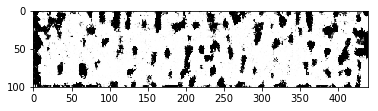

ishift: (-1813958.27476+0j) (100, 440)
ifft: 13104 (100, 440)
Estimate: [[-108.40561676]]
Iteration: 21100 at 2018-01-09 13:02:06.683595


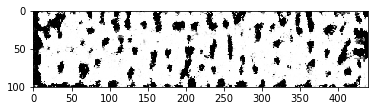

ishift: (-1813951.76282+0j) (100, 440)
ifft: 13392 (100, 440)
Estimate: [[-106.8458786]]
Iteration: 21200 at 2018-01-09 13:06:43.118463


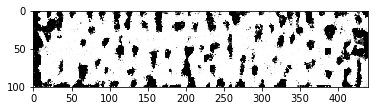

ishift: (-1813951.80189+0j) (100, 440)
ifft: 14239 (100, 440)
Estimate: [[-100.9814682]]
Iteration: 21300 at 2018-01-09 13:11:22.854795


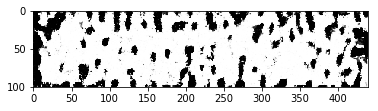

ishift: (-1813967.71551+0j) (100, 440)
ifft: 15244 (100, 440)
Estimate: [[-101.38664246]]


In [ ]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())


# Pre-train discriminator
for i in range(300):
    z_batch = np.random.normal(0, 1, size=[batch_size, z_dimensions])
    real_image_batch = sample_image.reshape([batch_size, img_height, img_width, 1])
    _, __, dLossReal, dLossFake = sess.run([d_trainer_real, d_trainer_fake, d_loss_real, d_loss_fake],
                                           {x_placeholder: real_image_batch, z_placeholder: z_batch})
    if(i % 100 == 0):
        print("dLossReal:", dLossReal, "dLossFake:", dLossFake)

# Train generator and discriminator together
for i in range(100000):
    real_image_batch = sample_image.reshape([batch_size, img_height, img_width, 1])
    z_batch = np.random.normal(0, 1, size=[batch_size, z_dimensions])

    # Train discriminator on both real and fake images
    _, __, dLossReal, dLossFake = sess.run([d_trainer_real, d_trainer_fake, d_loss_real, d_loss_fake],
                                           {x_placeholder: real_image_batch, z_placeholder: z_batch})

    # Train generator
    z_batch = np.random.normal(0, 1, size=[batch_size, z_dimensions])
    _ = sess.run(g_trainer, feed_dict={z_placeholder: z_batch})

    if i % 10 == 0:
        # Update TensorBoard with summary statistics
        z_batch = np.random.normal(0, 1, size=[batch_size, z_dimensions])
        summary = sess.run(merged, {z_placeholder: z_batch, x_placeholder: real_image_batch})
        writer.add_summary(summary, i)

    if i % 100 == 0:
        # Every 100 iterations, show a generated image
        print("Iteration:", i, "at", datetime.datetime.now())
        z_batch = np.random.normal(0, 1, size=[1, z_dimensions])
        generated_images = generator(z_placeholder, 1, z_dimensions)
        images = sess.run(generated_images, {z_placeholder: z_batch})
        plt.imshow(images[0].reshape([img_height, img_width]), cmap='Greys')
        plt.show()

        #save img
        plt.imsave('results/image/' + str(i)+'.png' , images[0].reshape([img_height, img_width]), cmap='Greys')
        #save sound
        
        # data4: bind training data, do ishift
        data4 = np.asarray(data2)
        data4.real = images[0].reshape([img_height, img_width])
        data4 = ishift(data4, data_min, data_max)
        print('ishift:', data4[0][0], data4.shape)

        # dataF: do ifft
        dataF = doIFFT(data4)
        dataF = dataF.astype('int16')
        print('ifft:', dataF[0][0], dataF.shape)

        # output: change digital to sound
        temp = 0
        for x in dataF:
            for y in x:
                file[temp]  = y
                temp = temp + 1
        wavfile.write('results/sound/' + str(i)+'.wav', rate, file)
        
        # Show discriminator's estimate
        im = images[0].reshape([1, img_height, img_width, 1])
        result = discriminator(x_placeholder)
        estimate = sess.run(result, {x_placeholder: im})
        print("Estimate:", estimate)

## 結論
這就是我們目前基本跑的GAN模型，來訓練聲音。